# Business Understanding

##### Overview:

Nairobi, the capital city of Kenya, is known for its heavy traffic congestion. Thousands of Kenyans commute to the city every day from nearby towns for work, business, and leisure. This commuting process can be time-consuming, and the traffic situation can significantly affect the length of the journey, making it difficult for commuters to plan their trips effectively.
To address this problem, i'll create a predictive model that uses traffic data from Uber Movement and historic bus ticket sales data from Mobiticket to predict the number of tickets that will be sold for buses into Nairobi from cities in "up country" Kenya.
By developing a reliable and accurate predictive model, Mobiticket and bus operators can anticipate customer demand for specific routes and schedule their resources and vehicles more efficiently. This can help reduce congestion on the roads, improve customer service, and enable the provision of additional services like micro-insurance.

##### Problem Statement:

The heavy traffic congestion in Nairobi is a significant challenge for commuters, bus operators, and Mobiticket. Commuters struggle to plan their journeys due to the unpredictable traffic patterns, while bus operators and Mobiticket face difficulties in managing resources efficiently to meet customer demand.

The lack of a reliable and accurate predictive model to anticipate customer demand for specific routes at particular times is a significant issue. This results in underutilized or overutilized vehicles, missed opportunities to offer additional services, and suboptimal customer experiences.

##### Objectives
* Develop a predictive model to accurately predict ticket sales for buses traveling into Nairobi from up country in Kenya.
* Use traffic data and historic ticket sales data to build the model.
* Enable Mobiticket and bus operators to better anticipate customer demand and allocate resources more efficiently.
* Improve customer service and offer additional services like micro-insurance.
* Reduce traffic congestion on Nairobi's roads.
* Enhance the overall commuting experience for residents and visitors.
* Know which day the majority of individuals travel from the rural areas to Nairobi

# Data Understanding

The data used for analysis and model building was obtained from [Uber Movement](http://movement.uber.com/) and is in a CSV format. The dataset includes several variables, which are described below.

Variables description:

* ride_id: unique ID of a vehicle on a specific route on a specific day and time.
* seat_number: seat assigned to ticket
* payment_method: method used by customer to purchase ticket from Mobiticket (cash or Mpesa)
* payment_receipt: unique id number for ticket purchased from Mobiticket
* travel_date: date of ride departure. (MM/DD/YYYY)
* travel_time: scheduled departure time of ride. Rides generally depart on time. (hh:mm)
* travel_from: town from which ride originated
* travel_to: destination of ride. All rides are to Nairobi.
* car_type: vehicle type (shuttle or bus)
* max_capacity: number of seats on the vehicle

In [52]:
# Importing the package used to load data
import pandas as pd
from datetime import date as dt

In [53]:
# Loading the data
data = pd.read_csv('/kaggle/input/train-revisedcsv/train_revised.csv', parse_dates=['travel_date'])

#Previewing the first five rows of the dataset
data.head()

,ride_id,seat_number,payment_method,payment_receipt,travel_date,travel_time,travel_from,travel_to,car_type,max_capacity
0,1442,15A,Mpesa,UZUEHCBUSO,2017-10-17,7:15,Migori,Nairobi,Bus,49
1,5437,14A,Mpesa,TIHLBUSGTE,2017-11-19,7:12,Migori,Nairobi,Bus,49
2,5710,8B,Mpesa,EQX8Q5G19O,2017-11-26,7:05,Keroka,Nairobi,Bus,49
3,5777,19A,Mpesa,SGP18CL0ME,2017-11-27,7:10,Homa Bay,Nairobi,Bus,49
4,5778,11A,Mpesa,BM97HFRGL9,2017-11-27,7:12,Migori,Nairobi,Bus,49


In [54]:
#Previewing the last five rows of the dataset
data.tail()

,ride_id,seat_number,payment_method,payment_receipt,travel_date,travel_time,travel_from,travel_to,car_type,max_capacity
51640,13826,9B,Mpesa,8V2XDDZR6V,2018-04-20,8:00,Awendo,Nairobi,Bus,49
51641,13809,18A,Mpesa,4PEBSVJSNK,2018-04-20,8:00,Migori,Nairobi,Bus,49
51642,13809,17A,Mpesa,LVN64LZDNN,2018-04-20,8:00,Migori,Nairobi,Bus,49
51643,13796,16B,Mpesa,REYBSKTYWN,2018-04-20,7:08,Awendo,Nairobi,Bus,49
51644,14304,7,Mpesa,AQN7FBUSGP,2017-11-14,5:10,Kisii,Nairobi,Bus,49


In [55]:
# Getting more information about the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51645 entries, 0 to 51644
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   ride_id          51645 non-null  int64         
 1   seat_number      51645 non-null  object        
 2   payment_method   51645 non-null  object        
 3   payment_receipt  51645 non-null  object        
 4   travel_date      51645 non-null  datetime64[ns]
 5   travel_time      51645 non-null  object        
 6   travel_from      51645 non-null  object        
 7   travel_to        51645 non-null  object        
 8   car_type         51645 non-null  object        
 9   max_capacity     51645 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(7)
memory usage: 3.9+ MB


The dataset contains data of three distinct data types, which are 1 datetime64, 2 integer, and 7 object. The column 'ride_id' appears to have an incorrect datatype which needs to be corrected. Furthermore, the dataset has no missing values.

In [56]:
# Summary statistics
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ride_id,51645.0,10188.645793,2211.295708,1442.0,8287.0,10353.0,12029.0,20117.0
max_capacity,51645.0,34.534321,18.451193,11.0,11.0,49.0,49.0,49.0


# Data Preparation

In this section, I will:
* Perform data type conversion on the variables with the wrong data types to make them accurate. 
* Group the data to obtain the count of tickets that will be sold for buses into Nairobi from cities in "up country" Kenya

In [57]:
# Converting 'ride_id' column to an object
data['ride_id'] = data['ride_id'].astype('object')
# Checking if conversion is successful
data['ride_id'].dtypes

dtype('O')

In [58]:
travel_df= data.groupby(['ride_id', 'travel_date', 'travel_time', 'travel_from',
                       'max_capacity']).size().reset_index(name='number_of_ticket') 

In [59]:
# Converting 'travel_time' into minutes
travel_df["travel_time"] = travel_df["travel_time"].apply(lambda x: sum(int(i) * 60 ** ind for ind, i in enumerate(reversed(x.split(":")))))

In [60]:
# Creating a day column that shows which day it is
travel_df['day'] = travel_df['travel_date'].dt.dayofweek.map({0: 'Monday',
                                                                1: 'Tuesday',
                                                                2: 'Wednesday',
                                                                3: 'Thursday',
                                                                4: 'Friday',
                                                                5: 'Saturday',
                                                                6: 'Sunday'}).astype(str)


In [61]:
# Previewing the first five rows of the new dataset
travel_df.head()

,ride_id,travel_date,travel_time,travel_from,max_capacity,number_of_ticket,day
0,1442,2017-10-17,435,Migori,49,1,Tuesday
1,5437,2017-11-19,432,Migori,49,1,Sunday
2,5710,2017-11-26,425,Keroka,49,1,Sunday
3,5777,2017-11-27,430,Homa Bay,49,5,Monday
4,5778,2017-11-27,432,Migori,49,31,Monday


In [62]:
#Previewing the last five rows of the new dataset
travel_df.tail()

,ride_id,travel_date,travel_time,travel_from,max_capacity,number_of_ticket,day
6244,20113,2018-07-02,420,Kisii,11,9,Monday
6245,20114,2017-12-12,430,Kisii,49,4,Tuesday
6246,20115,2017-06-12,430,Kisii,11,5,Monday
6247,20116,2017-11-27,430,Kisii,11,1,Monday
6248,20117,2017-11-27,300,Kisii,49,1,Monday


# EXPLOLATORY DATA ANALYSIS

In [63]:
travel_df.columns

Index(['ride_id', 'travel_date', 'travel_time', 'travel_from', 'max_capacity',
       'number_of_ticket', 'day'],
      dtype='object')

In [64]:
# Importing libraries necessary for visualizing
import seaborn as sns
sns.set_style("darkgrid")
import matplotlib.pyplot as plt
%matplotlib inline

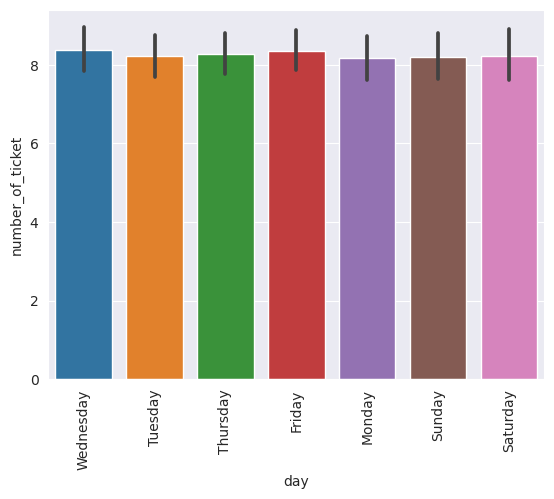

In [65]:
# creating a bar plot showing the average number of tickets sold per day of the week
sns.barplot(data=travel_df, x='day', y='number_of_ticket',
            order=travel_df.groupby('day').count().sort_values('number_of_ticket',
                                                              ascending=False).index)
# rotating the x-axis labels by 90 degrees for better readability
plt.xticks(rotation=90)
plt.show()

In [66]:
travel_df.to_csv('bus_ticket_Nairobi.csv')

Based on the bar plot depicted above, it can be inferred that the majority of people traveled from upcountry to Nairobi on Wednesday.

# Feature Engineering

In [67]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

In [68]:
# Perform one-hot encoding on the categorical columns
df = pd.get_dummies(travel_df, columns=['travel_from', 'day'])

In [69]:
# Determining the predictor variables
X = df.drop(['number_of_ticket','travel_date','ride_id'],axis=1)

# Determining the target variables
y = df['number_of_ticket']

# Modeling
In this section, I will develop models that can predict the number of tickets that may be sold. The model with the lowest mean squared error will be selected as the best model for making predictions. The models that will be used include: 

+ linear regression
+ decision tree regressor
+ random forest regressor
+ neural network
+ gradient boosting
+ CatBoostRegressor
+ LGBMRegressor

1. `Neural Network`

In [74]:
import keras.backend as K
from keras.models import Sequential
from keras.layers import Dense

# splitting the data into training, validation, and test sets
X_train, X_valtest, y_train, y_valtest = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_valtest, y_valtest, test_size=0.5, random_state=42)

# standardizing the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# defining the neural network architecture
model = Sequential()
model.add(Dense(64, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(1, activation='linear'))

# compiling the model with R squared as the metric
model.compile(loss='mse', optimizer='adam')

# training the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, 
                    validation_data=(X_val, y_val))



Epoch 1/100
157/157 [==============================] - 1s 4ms/step - loss: 96.0972 - val_loss: 70.9543
Epoch 2/100
157/157 [==============================] - 0s 3ms/step - loss: 52.1211 - val_loss: 50.3166
Epoch 3/100
157/157 [==============================] - 0s 3ms/step - loss: 45.6899 - val_loss: 48.6054
Epoch 4/100
157/157 [==============================] - 0s 3ms/step - loss: 44.6711 - val_loss: 48.2712
Epoch 5/100
157/157 [==============================] - 0s 3ms/step - loss: 44.1395 - val_loss: 47.6668
Epoch 6/100
157/157 [==============================] - 0s 3ms/step - loss: 43.7047 - val_loss: 47.4450
Epoch 7/100
157/157 [==============================] - 1s 3ms/step - loss: 43.2901 - val_loss: 47.1911
Epoch 8/100
157/157 [==============================] - 0s 3ms/step - loss: 42.8948 - val_loss: 47.0001
Epoch 9/100
157/157 [==============================] - 1s 4ms/step - loss: 42.5934 - val_loss: 46.6072
Epoch 10/100
157/157 [==============================] - 1s 3ms/step - los

20/20 [==============================] - 0s 2ms/step - loss: 50.9573
Base sequential Training loss: 39.714237213134766
Base Sequential Test loss: 50.957332611083984


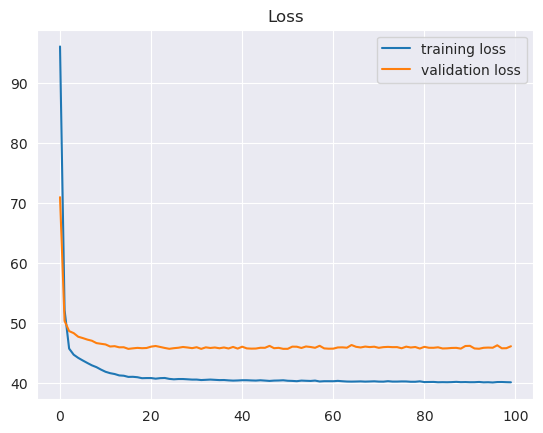

In [79]:
# evaluating the model on the training and test sets
base_nt_train_loss = model.evaluate(X_train, y_train)
base_nt_test_loss= model.evaluate(X_test, y_test)

print('Base sequential Training loss:', base_nt_train_loss)
print('Base Sequential Test loss:', base_nt_test_loss)

# extracting the loss and R squared from the history object
loss = history.history['loss']
val_loss = history.history['val_loss']

# plotting the loss
plt.plot(loss, label='training loss')
plt.plot(val_loss, label='validation loss')
plt.legend()
plt.title('Loss')
plt.show()

In [72]:
# from keras.wrappers.scikit_learn import KerasRegressor
# from sklearn.model_selection import GridSearchCV

# # define the function to create the model
# def create_model(optimizer='adam', activation='relu', neurons=64):
#     def r_squared(y_true, y_pred):
#         SS_res =  K.sum(K.square(y_true - y_pred)) 
#         SS_tot = K.sum(K.square(y_true - K.mean(y_true))) 
#         return ( 1 - SS_res/(SS_tot + K.epsilon()) )

#     model = Sequential()
#     model.add(Dense(neurons, activation=activation, input_dim=X_train.shape[1]))
#     model.add(Dense(1, activation='linear'))
#     model.compile(loss='mse', optimizer=optimizer, metrics=[r_squared])
#     return model

# # create the KerasRegressor object
# model = KerasRegressor(build_fn=create_model, epochs=100, batch_size=32, verbose=0)

# # define the hyperparameters to tune
# param_grid = {
#     'neurons': [32, 64, 128],
#     'activation': ['relu', 'sigmoid'],
#     'optimizer': ['adam', 'rmsprop']
# }

# # perform the grid search
# grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='r2', cv=5)
# grid_result = grid.fit(X_train, y_train)

# # print the results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


In [78]:
# define the neural network architecture
best_model = Sequential()
best_model.add(Dense(128, activation='sigmoid', input_dim=X_train.shape[1]))
best_model.add(Dense(1, activation='linear'))

best_model.compile(loss='mse', optimizer='adam')

# train the model
best_history = best_model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/100
157/157 [==============================] - 1s 4ms/step - loss: 84.3158 - val_loss: 67.3645
Epoch 2/100
157/157 [==============================] - 0s 3ms/step - loss: 57.0068 - val_loss: 57.6533
Epoch 3/100
157/157 [==============================] - 0s 3ms/step - loss: 51.1811 - val_loss: 53.5630
Epoch 4/100
157/157 [==============================] - 0s 3ms/step - loss: 48.4795 - val_loss: 51.7724
Epoch 5/100
157/157 [==============================] - 0s 3ms/step - loss: 47.3183 - val_loss: 51.0540
Epoch 6/100
157/157 [==============================] - 0s 3ms/step - loss: 46.7899 - val_loss: 50.8895
Epoch 7/100
157/157 [==============================] - 0s 3ms/step - loss: 46.5197 - val_loss: 50.5430
Epoch 8/100
157/157 [==============================] - 1s 4ms/step - loss: 46.3572 - val_loss: 50.3739
Epoch 9/100
157/157 [==============================] - 1s 3ms/step - loss: 46.2169 - val_loss: 50.1229
Epoch 10/100
157/157 [==============================] - 0s 3ms/step - los

20/20 [==============================] - 0s 3ms/step - loss: 51.2991
Tuned Sequential Training loss: 40.49760437011719
Tuned Sequential Test loss: 51.299137115478516


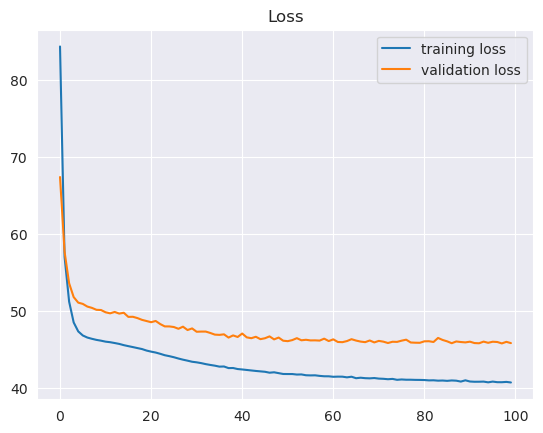

In [80]:
# evaluating the model on the training and test sets
best_train_loss = best_model.evaluate(X_train, y_train)
best_test_loss = best_model.evaluate(X_test, y_test)

print('Tuned Sequential Training loss:', best_train_loss)
print('Tuned Sequential Test loss:', best_test_loss)

# extracting the loss and R squared from the history object
loss = best_history.history['loss']
val_loss = best_history.history['val_loss']

# plotting the loss
plt.plot(loss, label='training loss')
plt.plot(val_loss, label='validation loss')
plt.legend()
plt.title('Loss')
plt.show()


The sequential neural network model is capable of generating predictions that are relatively accurate since they have low mean squared error and which indicates a small amount of error in predictions.

2. `Linear Regression`


In [81]:
# Splitting the data to training set and testing set
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size =0.2,random_state =42)

In [84]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV


# Defining the pipeline to scale the data
scaling_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

# Fit the scaling_pipeline on X_train
scaling_pipeline.fit(X_train)

# Defining the pipeline
base_lr_pipe = Pipeline([('Regressor',LinearRegression())])

# Fitting the pipeline to the training data
base_lr_pipe.fit(X_train, y_train)

# Using the pipeline to predict the target variable
y_train_pred = base_lr_pipe.predict(X_train)
X_test_scaled = scaling_pipeline.transform(X_test)
y_test_pred = base_lr_pipe.predict(X_test_scaled)

# Evaluating the pipeline on training and test set
train_mse = mean_squared_error(y_train,y_train_pred,squared=True)
test_mse = mean_squared_error(y_test,y_test_pred,squared=True)
print('Linear Regression Training MSE:', train_mse)
print('Linear Regression Test MSE:', test_mse)

Linear Regression Training MSE: 45.40657030190031
Linear Regression Test MSE: 472.3108861614859


The linear regression model has a very high mean squared error on the testing data,this shows that it is performing poorly on unseen data and a low mean squared error in the training data this means that the model is overfitting in the training data

3. `CatBoostRegressor`

In [ ]:
from catboost import CatBoostRegressor

In [85]:
# Defining the pipeline
base_cat_pipe = Pipeline([('Regressor',CatBoostRegressor())])

# fitting the pipeline to the training data
base_cat_pipe.fit(X_train,y_train)

# Using the pipeline to predict the target variable
y_train_pred = base_cat_pipe.predict(X_train)
y_test_pred = base_cat_pipe.predict(X_test_scaled)

# Evaluating the pipeline on training and test set
train_mse = mean_squared_error(y_train,y_train_pred,squared=True)
test_mse = mean_squared_error(y_test,y_test_pred,squared=True)
print('Catboost Training MSE:', train_mse)
print('Catboost Test MSE:', test_mse)

Learning rate set to 0.052796
0:	learn: 8.3408320	total: 1.31ms	remaining: 1.31s
1:	learn: 8.1628234	total: 2.56ms	remaining: 1.28s
2:	learn: 7.9901924	total: 3.76ms	remaining: 1.25s
3:	learn: 7.8301081	total: 4.96ms	remaining: 1.23s
4:	learn: 7.6861185	total: 6.32ms	remaining: 1.26s
5:	learn: 7.5568272	total: 7.47ms	remaining: 1.24s
6:	learn: 7.4309580	total: 8.93ms	remaining: 1.27s
7:	learn: 7.3256614	total: 9.92ms	remaining: 1.23s
8:	learn: 7.2247530	total: 10.9ms	remaining: 1.21s
9:	learn: 7.1507900	total: 12ms	remaining: 1.19s
10:	learn: 7.0640619	total: 13ms	remaining: 1.17s
11:	learn: 6.9821758	total: 14.1ms	remaining: 1.16s
12:	learn: 6.9110659	total: 15.1ms	remaining: 1.15s
13:	learn: 6.8630095	total: 16.2ms	remaining: 1.14s
14:	learn: 6.7919049	total: 17.3ms	remaining: 1.14s
15:	learn: 6.7270015	total: 18.3ms	remaining: 1.13s
16:	learn: 6.6765106	total: 19.3ms	remaining: 1.12s
17:	learn: 6.6368672	total: 20.3ms	remaining: 1.11s
18:	learn: 6.5889278	total: 21.4ms	remaining: 1.

The baseline catboost regressor model seems to be underfit the testing data

In [ ]:
cat_param_grid = {
    'Regressor__learning_rate': [0.01, 0.1, 1],
    'Regressor__n_estimators': [100, 500, 1000],
    'Regressor__max_depth': [3, 5, 7],
    'Regressor__min_child_samples': [1, 5, 10],
    'Regressor__subsample': [0.5, 0.7, 1.0],
    'Regressor__colsample_bylevel': [0.5, 0.7, 1.0]
}

# perform the grid search
cat_grid_search = GridSearchCV(base_cat_pipe, cat_param_grid, cv=5, scoring='neg_mean_squared_error')
cat_grid_search.fit(X_train, y_train)
cat_grid_search.best_params_

0:	learn: 8.6005310	total: 858us	remaining: 85ms
1:	learn: 8.5851318	total: 1.63ms	remaining: 79.8ms
2:	learn: 8.5681469	total: 2.16ms	remaining: 69.8ms
3:	learn: 8.5510071	total: 2.67ms	remaining: 64.1ms
4:	learn: 8.5282063	total: 3.22ms	remaining: 61.1ms
5:	learn: 8.5064494	total: 3.71ms	remaining: 58.1ms
6:	learn: 8.4860044	total: 4.23ms	remaining: 56.2ms
7:	learn: 8.4640567	total: 4.74ms	remaining: 54.5ms
8:	learn: 8.4463817	total: 5.26ms	remaining: 53.1ms
9:	learn: 8.4303918	total: 5.78ms	remaining: 52ms
10:	learn: 8.4134447	total: 6.3ms	remaining: 51ms
11:	learn: 8.3969094	total: 6.8ms	remaining: 49.9ms
12:	learn: 8.3841427	total: 7.33ms	remaining: 49ms
13:	learn: 8.3633787	total: 7.87ms	remaining: 48.3ms
14:	learn: 8.3429720	total: 8.41ms	remaining: 47.7ms
15:	learn: 8.3233109	total: 8.93ms	remaining: 46.9ms
16:	learn: 8.3060161	total: 9.43ms	remaining: 46ms
17:	learn: 8.2849054	total: 9.94ms	remaining: 45.3ms
18:	learn: 8.2726516	total: 10.4ms	remaining: 44.5ms
19:	learn: 8.260

In [ ]:
# Defining the pipeline
best_cat_pipe = Pipeline([('Regressor',CatBoostRegressor(iterations=200,
                                                         depth=4,
                                                         learning_rate=0.5,
                                                         loss_function='RMSE',
                                                         verbose=False))])

# fitting the pipeline to the training data
best_cat_pipe.fit(X_train,y_train)

# Using the pipeline to predict the target variable
y_train_pred = best_cat_pipe.predict(X_train)
y_test_pred = best_cat_pipe.predict(X_test_scaled)

# Evaluating the pipeline on training and test set
train_mse = mean_squared_error(y_train,y_train_pred,squared=True)
train_rsquared = r2_score(y_train,y_train_pred)
test_mse = mean_squared_error(y_test,y_test_pred,squared=True)
test_rsquared = r2_score(y_test,y_test_pred)
print('Training MSE:', train_mse)
print('Test MSE:', test_mse)